## Essais de normalisation du contrast

Ce document est un bref panorama des différentes transformation d'intensité auxquelles ont pourrait songer.
Pas besoin de lire le code, les formules/liens sont suffisants

J'ai séléctionné 5 images assez variées en tant qu'exemples


Les images sont : 



Image name : 070525-JPB-MEB-EIHNValves-Ech6-ZigZag0074.tif 
 _________________________


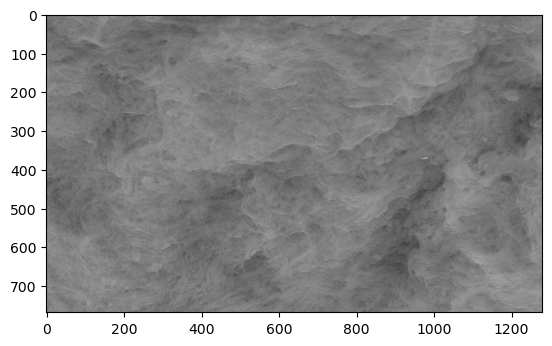

Image name : 060722-Nabila-JP-Valves-WholeMount-SAureus-pat02-28.tif 
 _________________________


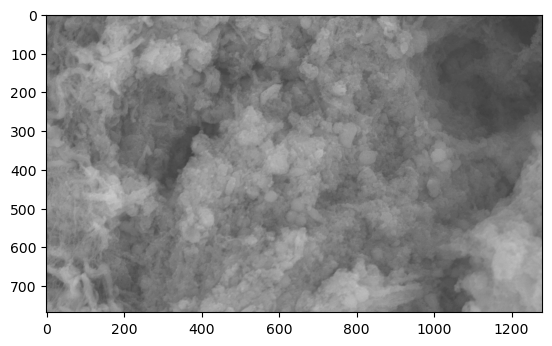

Image name : 070525-JPB-MEB-EIHNValves-Ech5-ZigZag0015.tif 
 _________________________


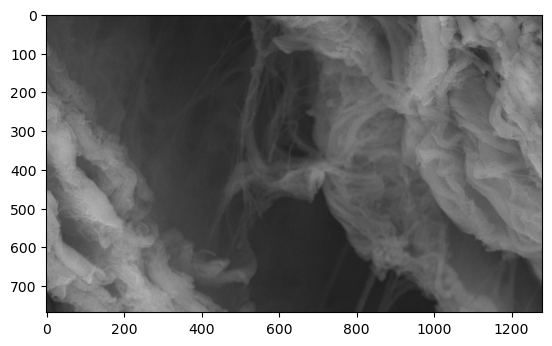

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0081.tif 
 _________________________


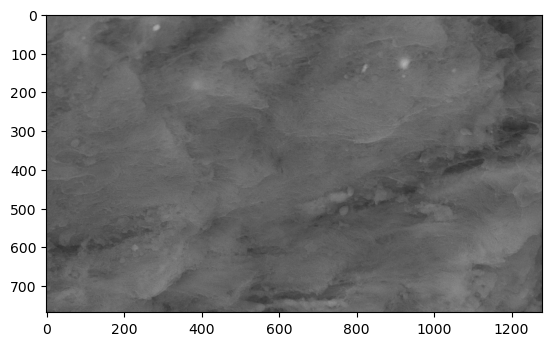

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0011.tif 
 _________________________


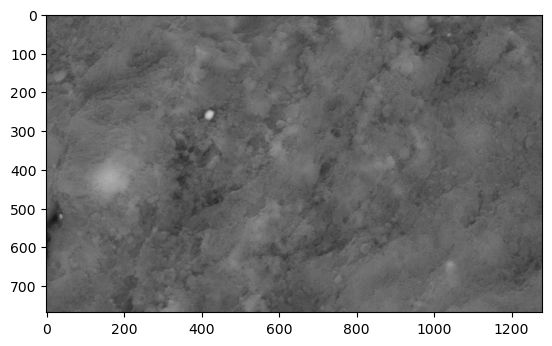

In [1]:
import os 
import numpy as np
from PIL import Image 
import matplotlib.pyplot as plt 


data_folder="/home/adrienb/Documents/Adrien/datasets/DatasetDemo/ExempleContrast"
for im in os.listdir(data_folder) : 
    print("Image name : {} \n _________________________".format(im))
    i=np.array(Image.open(os.path.join(data_folder,im)))
    plt.imshow(i,cmap="gray",vmin=0,vmax=255)
    plt.show()
    


def plot_exemples(data_folder, transform : callable): 
            
        for im in os.listdir(data_folder):
            print(f"Image name : {im}\n_________________________")
            
            i = np.array(Image.open(os.path.join(data_folder, im)).convert("L"))
            i_transform = np.array(transform(i))

        
            fig, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].imshow(i, cmap="gray", vmin=0, vmax=255)
            axs[0].set_title("Image d'origine")
            axs[0].axis("off")
            axs[1].hist(i.ravel(), bins=256, range=(0, 255), color='gray')
            axs[1].set_title("Histogramme original")
            plt.tight_layout()
            plt.show()

            
            fig, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].imshow(i_transform, cmap="gray", vmin=0, vmax=255)
            axs[0].set_title("Image transformée")
            axs[0].axis("off")
            axs[1].hist(i_transform.ravel(), bins=256, range=(0, 255), color='gray')
            axs[1].set_title("Histogramme transformé")
            plt.tight_layout()
            plt.show()


### Histogram stretching

Avec ce traitement, on tente de rendre plus d'informations perceptibles en étalant l'histogramme sur toute la plage 8bits.


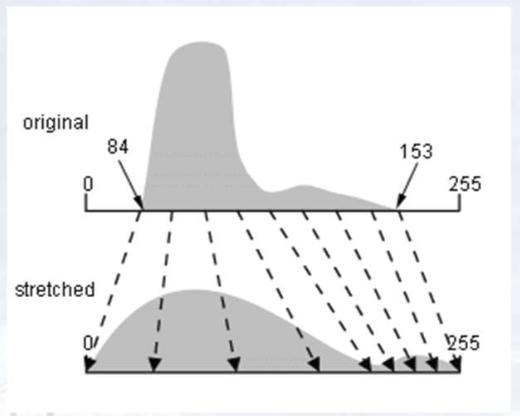

$$
I_{\text{new}} = \frac{I - I_{\min}}{I_{\max} - I_{\min}} \times 255
$$


Image name : 070525-JPB-MEB-EIHNValves-Ech6-ZigZag0074.tif
_________________________


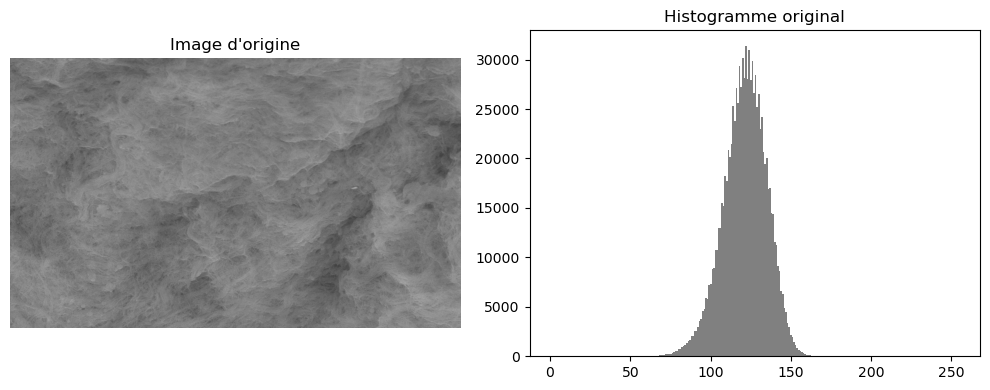

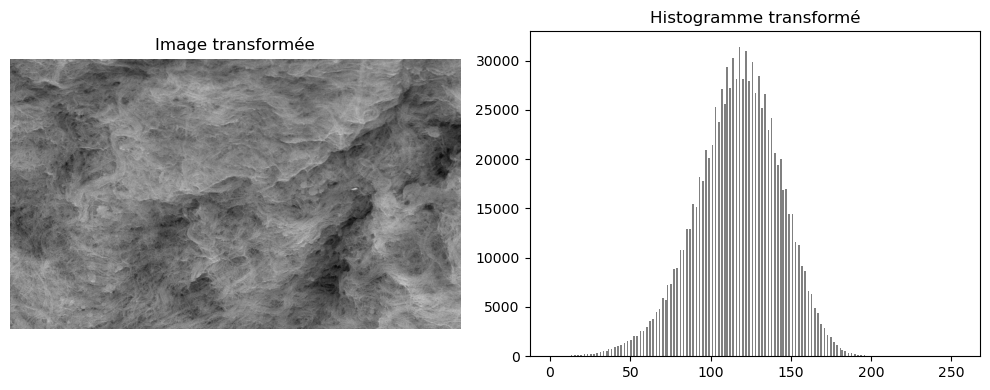

Image name : 060722-Nabila-JP-Valves-WholeMount-SAureus-pat02-28.tif
_________________________


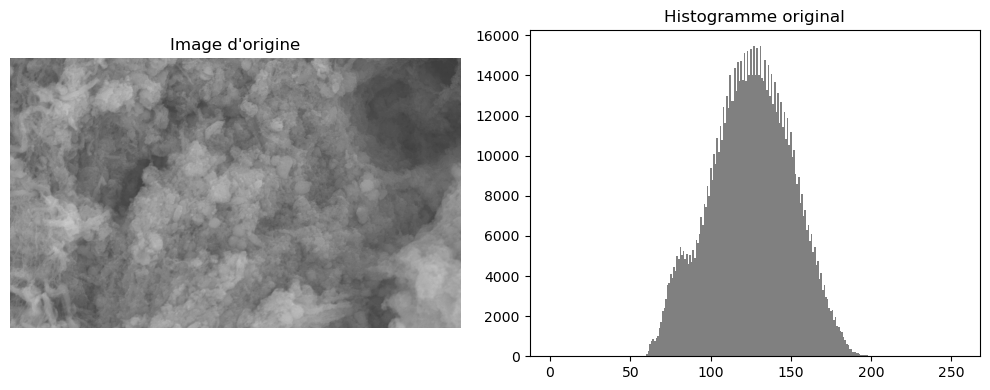

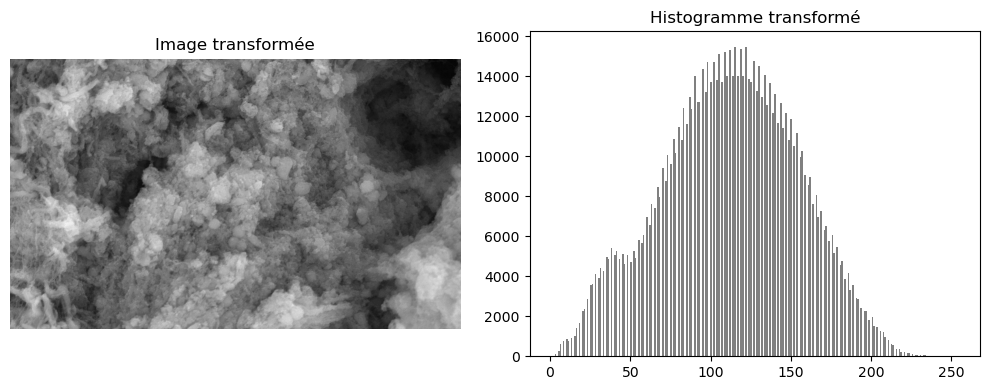

Image name : 070525-JPB-MEB-EIHNValves-Ech5-ZigZag0015.tif
_________________________


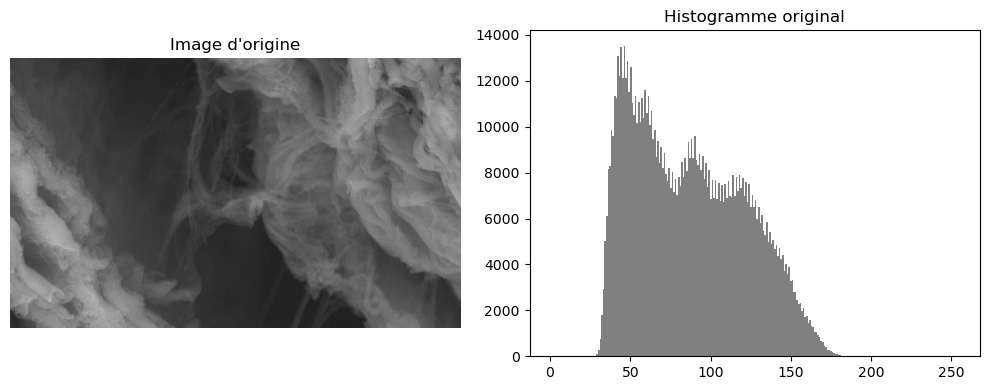

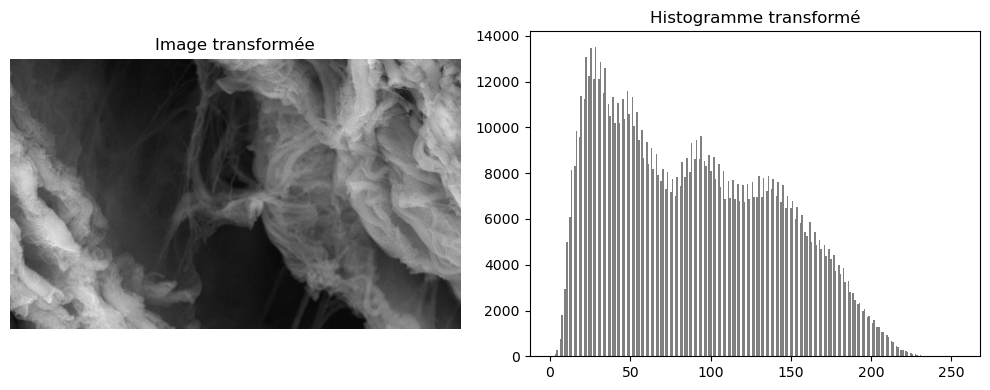

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0081.tif
_________________________


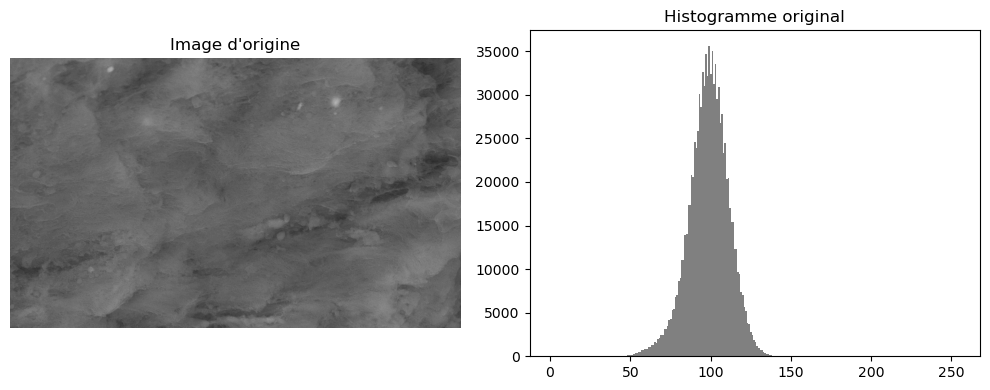

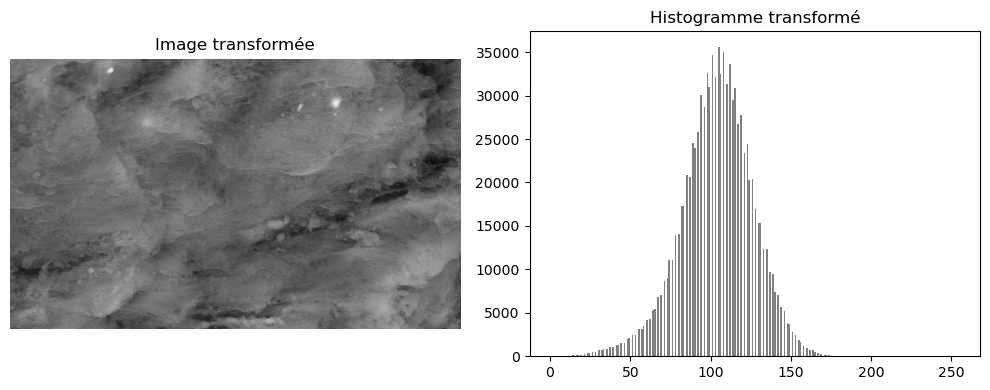

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0011.tif
_________________________


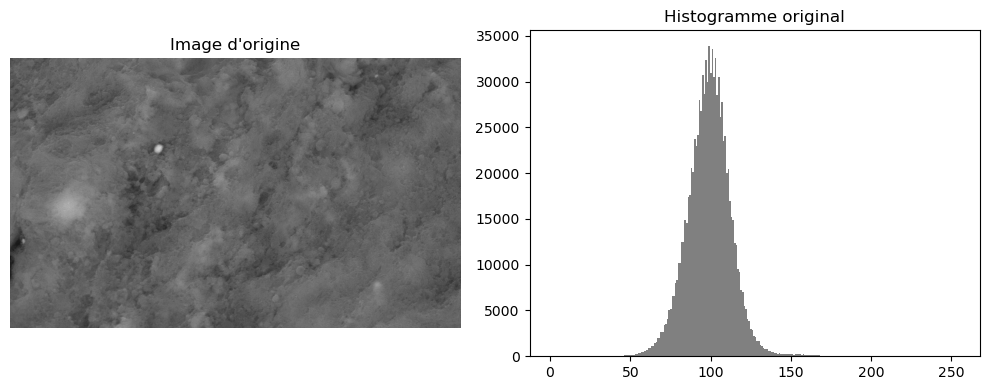

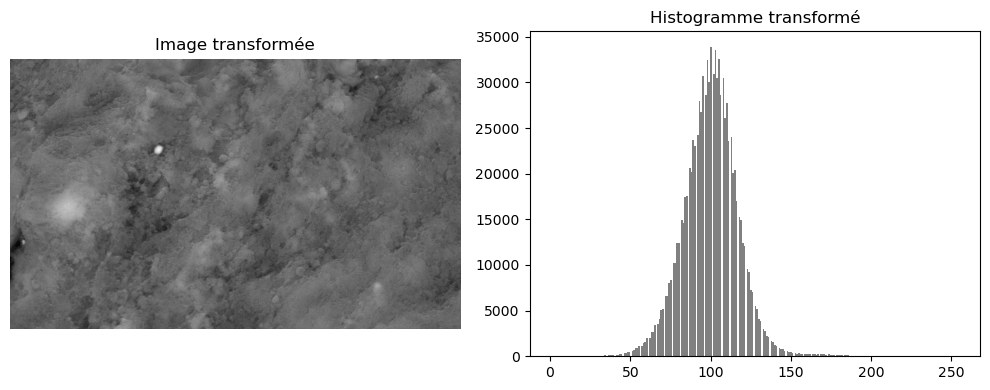

In [2]:
import cv2

def histogram_stretching(img : np.ndarray):
 
        """ """
        
        min_val, max_val = np.min(img), np.max(img)
        result = ((img - min_val) / (max_val - min_val) * 255).astype(np.uint8)

        return Image.fromarray(result)

import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image




plot_exemples(data_folder=data_folder,transform=histogram_stretching)

## Auto-Contrast

Algorithme similaire à Auto Contrast de ImageJ. 
suppression des valeurs extrèmes, puis stretching de l'histogramme.

Source : 

https://github.com/tristanmanchester/ImageJ-AutoContrast-Python/blob/main/AutoHistStretch.py





Image name : 070525-JPB-MEB-EIHNValves-Ech6-ZigZag0074.tif
_________________________
Scaling whole-image histogram.


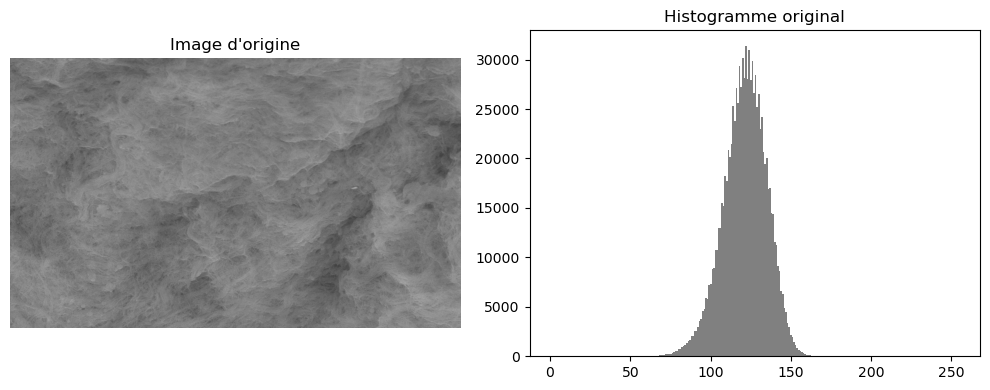

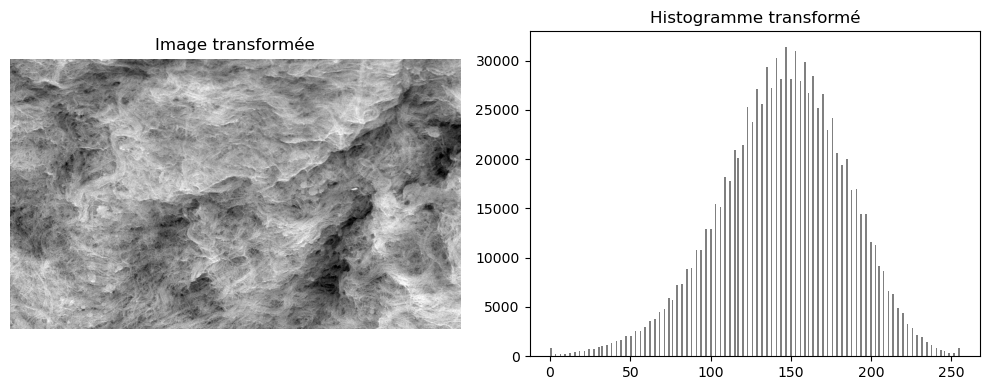

Image name : 060722-Nabila-JP-Valves-WholeMount-SAureus-pat02-28.tif
_________________________
Scaling whole-image histogram.


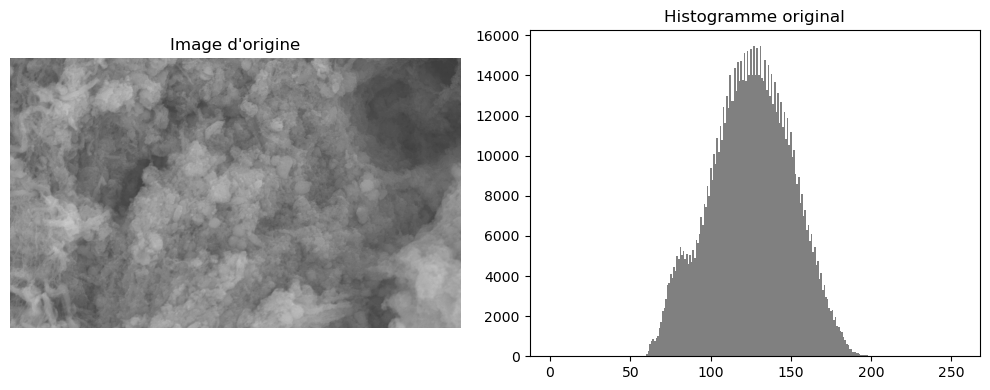

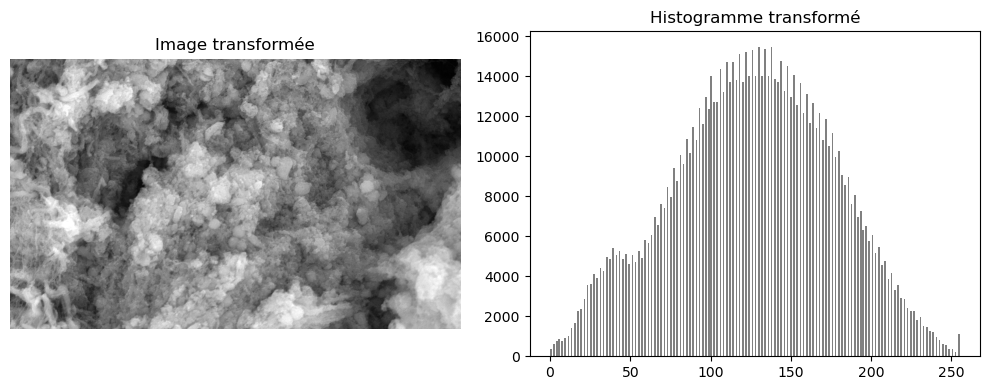

Image name : 070525-JPB-MEB-EIHNValves-Ech5-ZigZag0015.tif
_________________________
Scaling whole-image histogram.


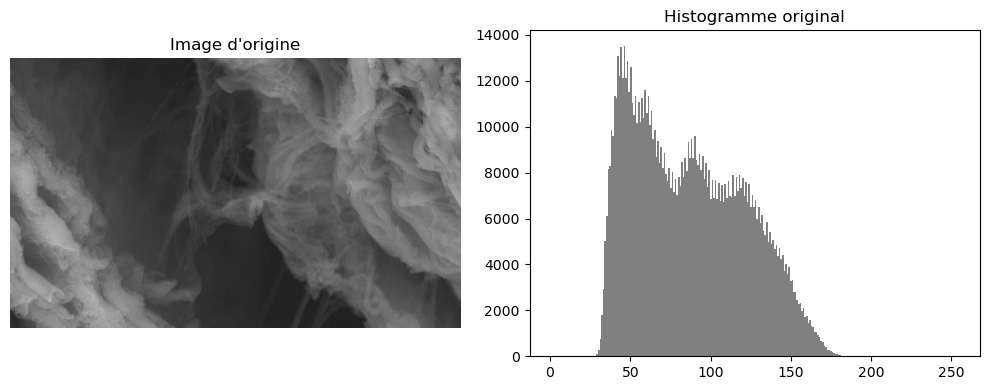

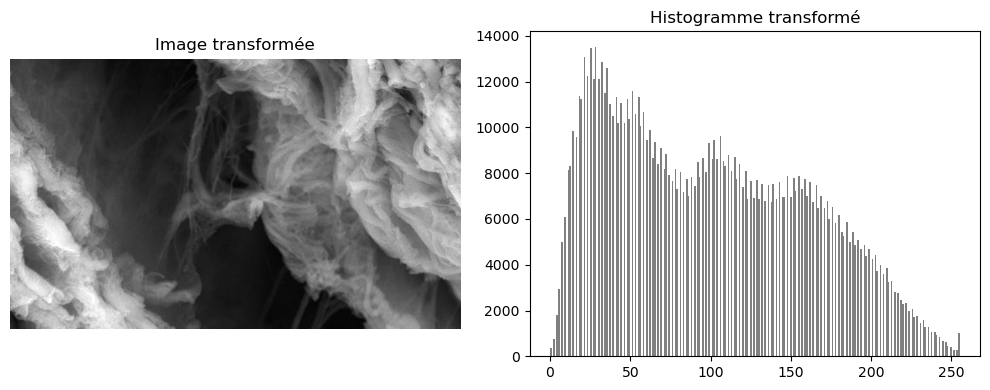

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0081.tif
_________________________
Scaling whole-image histogram.


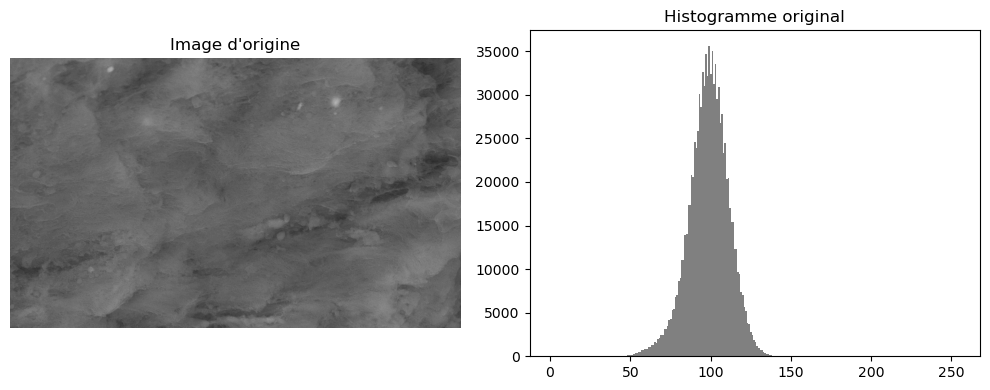

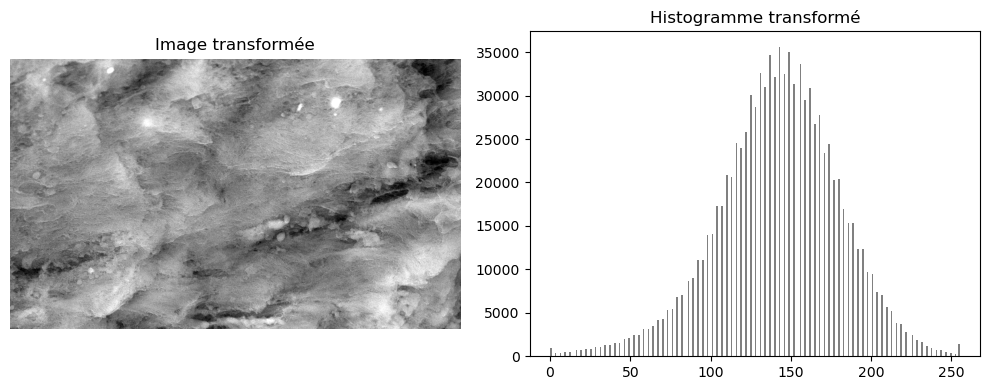

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0011.tif
_________________________
Scaling whole-image histogram.


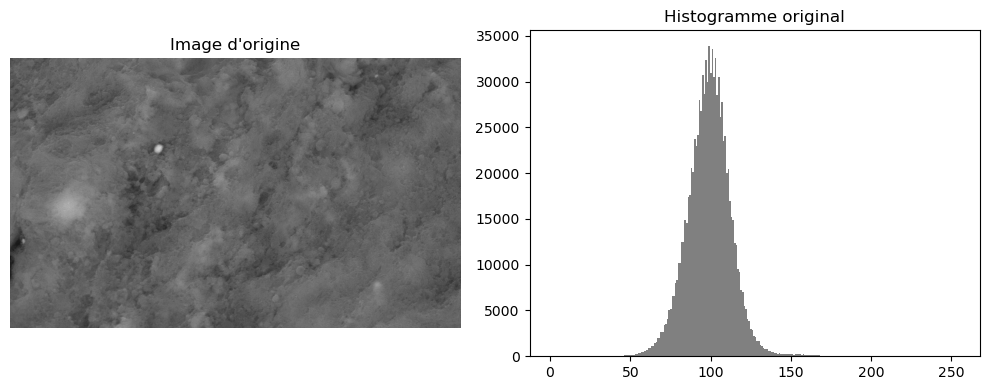

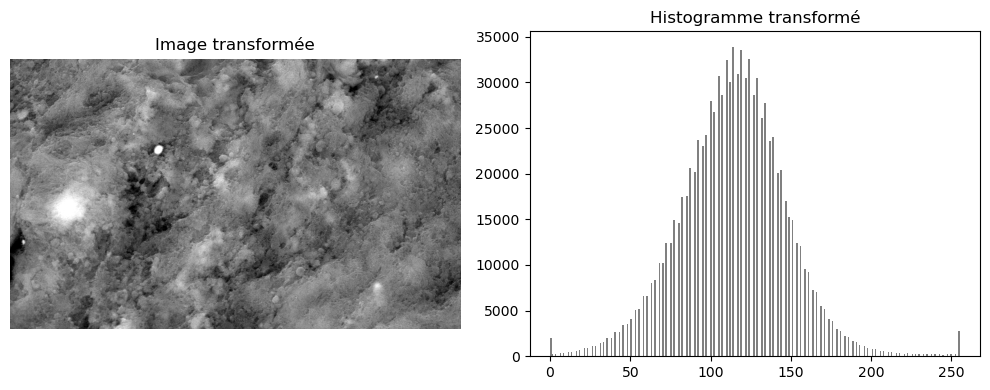

In [3]:

def calculate_bounds(histogram, pixel_count, bin_size, hist_min):
    """
    Calculate the minimum and maximum pixel values for histogram scaling.
    
    Parameters:
    - histogram (array): The histogram of the image.
    - pixel_count (int): Total number of pixels in the region being considered.
    - bin_size (float): The size of each bin in the histogram.
    - hist_min (float): The minimum pixel value in the histogram.
    
    Returns:
    - min_val (float): Minimum pixel value for scaling.
    - max_val (float): Maximum pixel value for scaling.
    """
    limit = pixel_count // 10
    threshold = pixel_count // 5000
    hmin, hmax = -1, -1
    
    # Find the minimum pixel value for scaling
    for i, count in enumerate(histogram):
        if count > limit:
            continue
        if count > threshold:
            hmin = i
            break
            
    # Find the maximum pixel value for scaling
    for i, count in reversed(list(enumerate(histogram))):
        if count > limit:
            continue
        if count > threshold:
            hmax = i
            break

    min_val = hist_min + hmin * bin_size
    max_val = hist_min + hmax * bin_size
    
    return min_val, max_val

def AutoContrast(image, centre_x_coord=None, centre_y_coord=None, hist_region_diameter=None, proportional=False):
    """
    Apply histogram scaling to an image based on a specified region.
    
    Parameters:
    - image_path (str): The file path of the input image.
    - output_path (str): The file path to save the output image.
    - centre_x_coord (float or int): X-coordinate of the center of the region.
    - centre_y_coord (float or int): Y-coordinate of the center of the region.
    - hist_region_diameter (float or int): Diameter of the region for histogram calculation.
    - proportional (bool): If True, coordinates and diameter are specified as proportions.
    
    Note:
    - When proportional=True, hist_region_diameter is a proportion of the x-dimension of the image.
    """
    crop_variables = {
        'X-coordinate': centre_x_coord,
        'Y-coordinate': centre_y_coord,
        'Region diameter': hist_region_diameter
    }

    with Image.fromarray(image) as img:
        # Convert image to grayscale if it's not
        if img.mode not in ('L', 'I;16'):
            img = img.convert('L')
        if img.mode not in ('L', 'I;16'):
            print(f"Error: Could not convert image  to grayscale.")
            return
        width, height = img.size

        # Convert to pixel values if proportional=True
        if proportional:
            if centre_x_coord is not None:
                centre_x_coord = int(centre_x_coord * width)
            if centre_y_coord is not None:
                centre_y_coord = int(centre_y_coord * height)
            if hist_region_diameter is not None:
                hist_region_diameter = int(hist_region_diameter * width)
        
        # Check if all crop variables are given
        if all(crop_variables.values()):
            half_diameter = hist_region_diameter // 2
            left = max(centre_x_coord - half_diameter, 0)
            top = max(centre_y_coord - half_diameter, 0)
            right = min(centre_x_coord + half_diameter, width)
            bottom = min(centre_y_coord + half_diameter, height)
    
            # Crop the specified region for histogram calculation
            crop_region = img.crop((left, top, right, bottom))
        else:
            # Check if any crop variable is given
            any_vars_given = any(crop_variables.values())
            if any_vars_given:
                missing_keys = [key for key, value in crop_variables.items() if value is None]
                print(f'Not all crop variables were given (missing: {", ".join(missing_keys)}), scaling whole-image histogram instead.')
            else:
                print('Scaling whole-image histogram.')
            crop_region = img

        # Compute histogram and statistics of the cropped region
        crop_array = np.array(crop_region)
        histogram, bin_edges = np.histogram(crop_array, bins=256)
        hist_min = bin_edges[0]
        bin_size = bin_edges[1] - bin_edges[0]
        pixel_count = crop_array.size

        # Calculate min and max pixel values for scaling the whole image
        min_val, max_val = calculate_bounds(histogram, pixel_count, bin_size, hist_min)

        # Apply histogram scaling to the original image
        img_array = np.array(img)
        img_stretched_array = np.clip((img_array - min_val) * (255 / (max_val - min_val)), 0, 255).astype('uint8')
        img_stretched = Image.fromarray(img_stretched_array, 'L')

        return img_stretched




plot_exemples(data_folder=data_folder,transform=AutoContrast)

## Validation  


Le résultat de la l'auto-contrast avec imageJ, sur certains des exemples : 

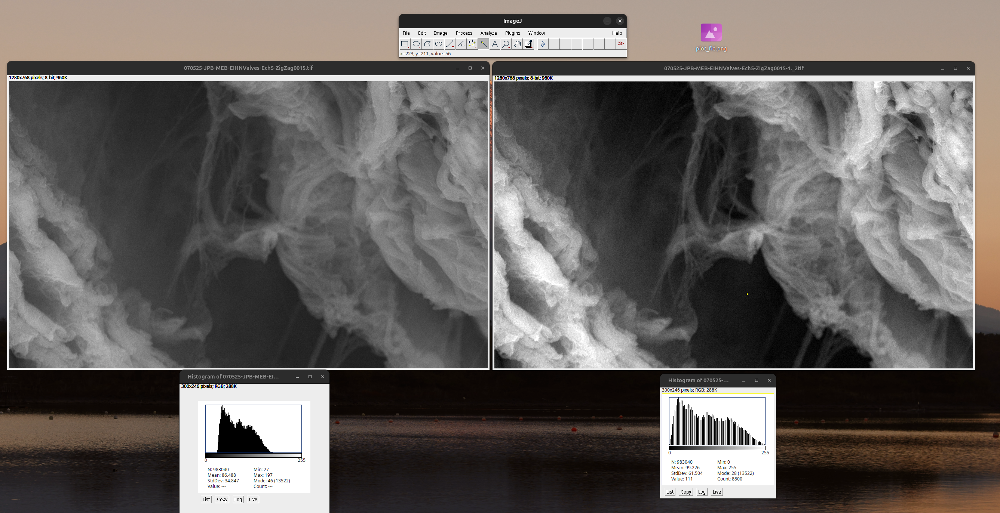

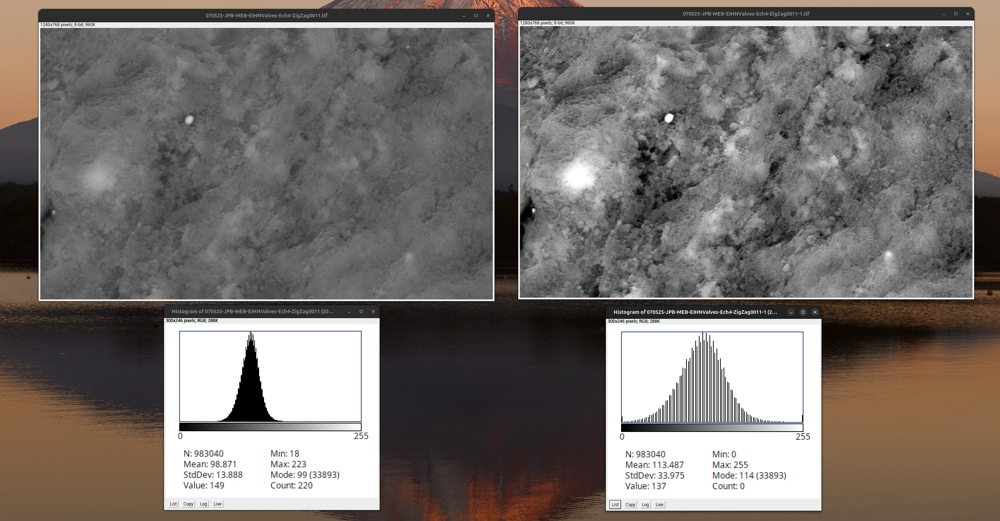




Les résultats obtenus par l'implémentation python sont bien similaires à ceux obtenus par la fonction AutoContrast de ImageJ.


## Histogram equalization

Explications tirées de : https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html 

Image name : 070525-JPB-MEB-EIHNValves-Ech6-ZigZag0074.tif
_________________________


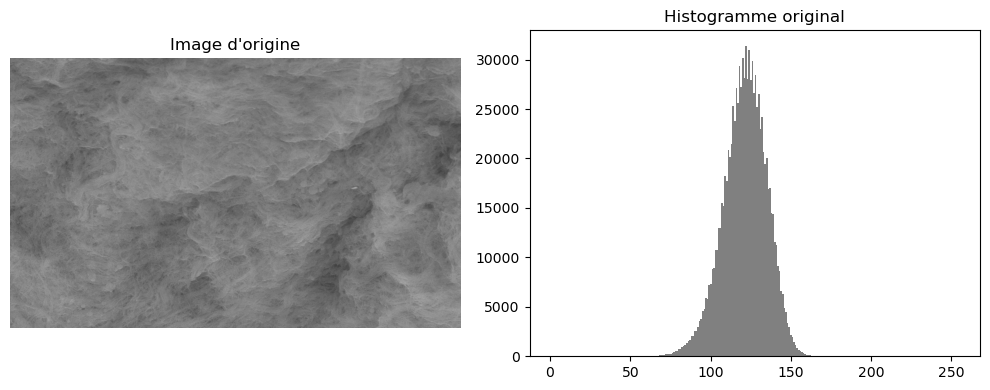

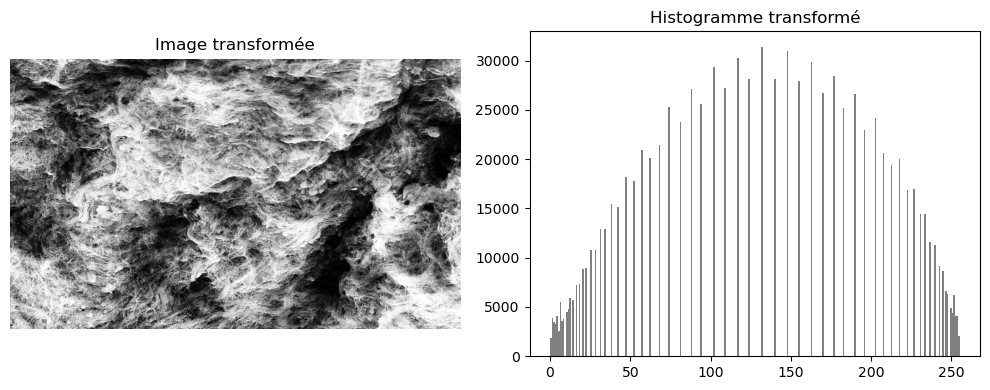

Image name : 060722-Nabila-JP-Valves-WholeMount-SAureus-pat02-28.tif
_________________________


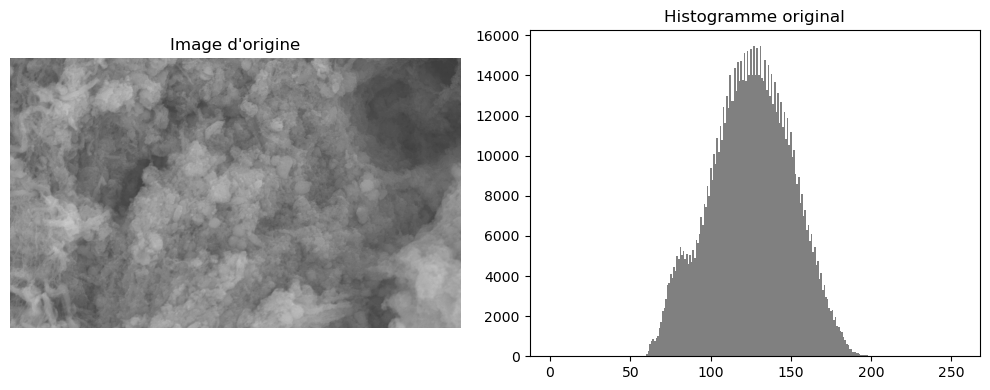

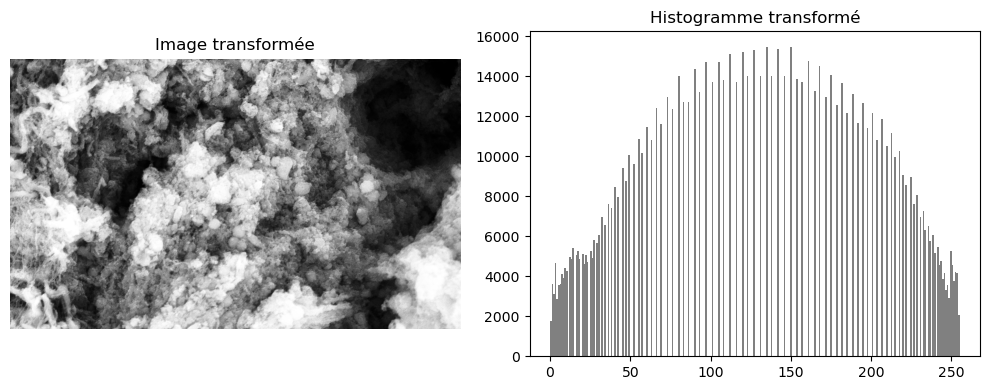

Image name : 070525-JPB-MEB-EIHNValves-Ech5-ZigZag0015.tif
_________________________


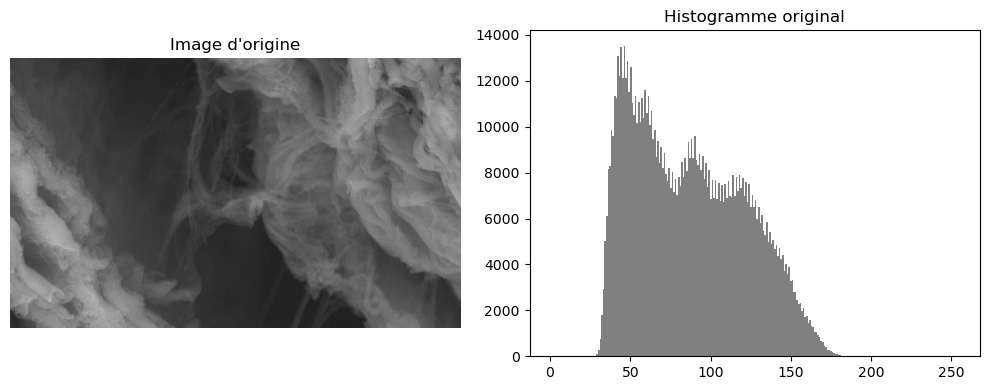

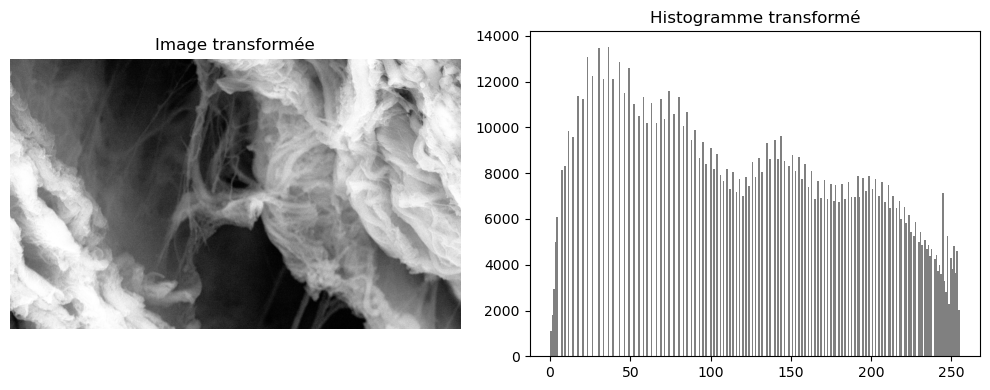

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0081.tif
_________________________


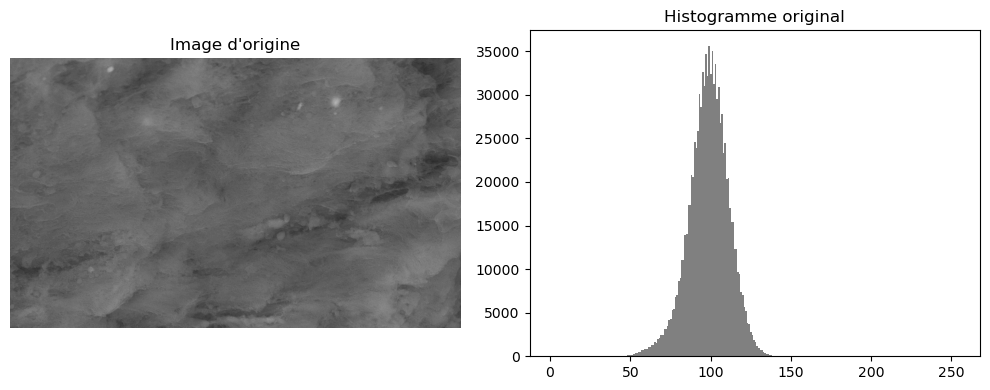

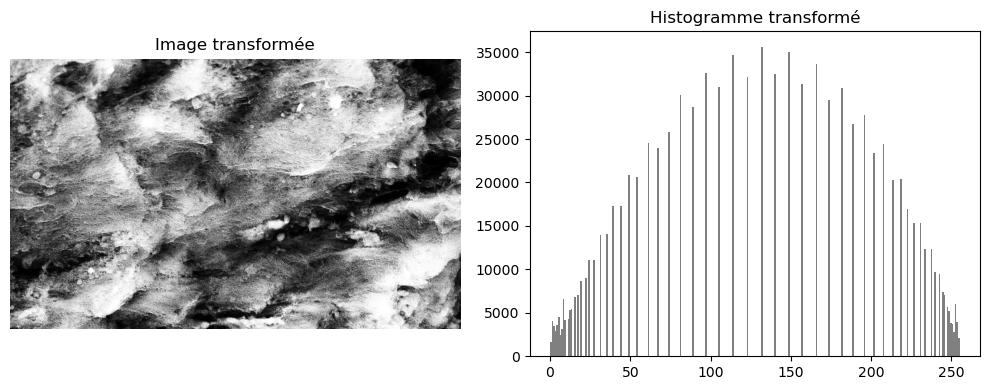

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0011.tif
_________________________


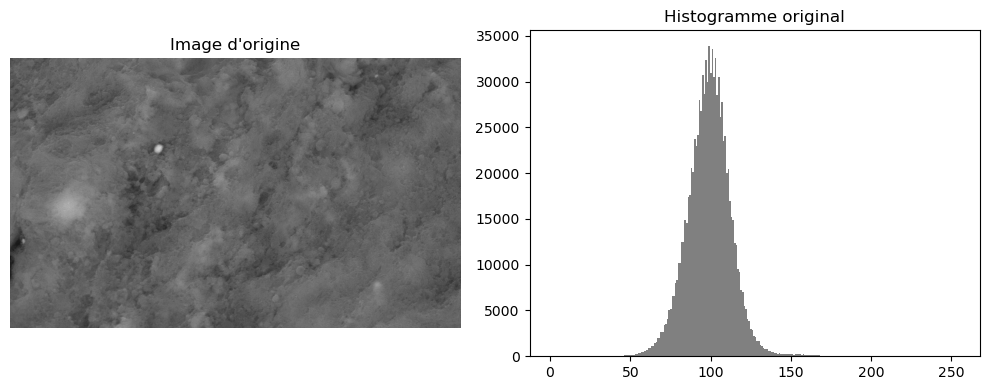

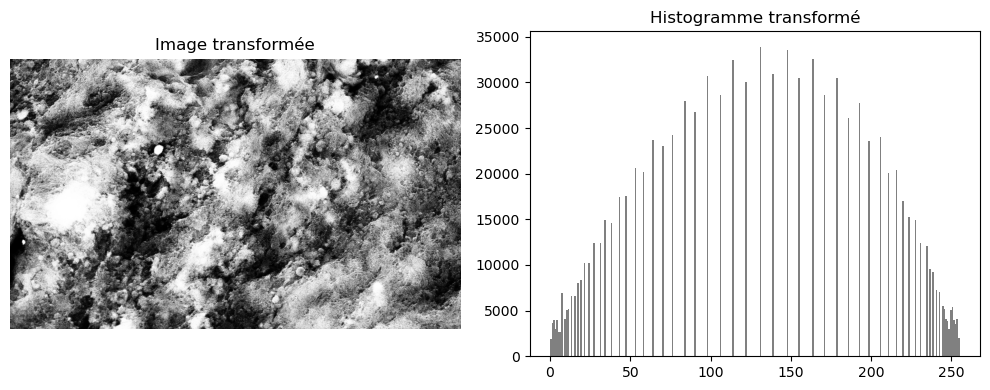

In [4]:
def equalizeHist(img : np.ndarray) :

    """   """
    result = cv2.equalizeHist(img)
    return result


plot_exemples(data_folder=data_folder,transform=equalizeHist)

## CLAHE - Tiled histogram normalisation 


Toujours le lien suivant : https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html 
Attention : Cette methode est pour moi dangereuse puisqu'elle procède à une égalisation de l'histogramme, mais des portions d'image de manière indépendante.


Image name : 070525-JPB-MEB-EIHNValves-Ech6-ZigZag0074.tif
_________________________


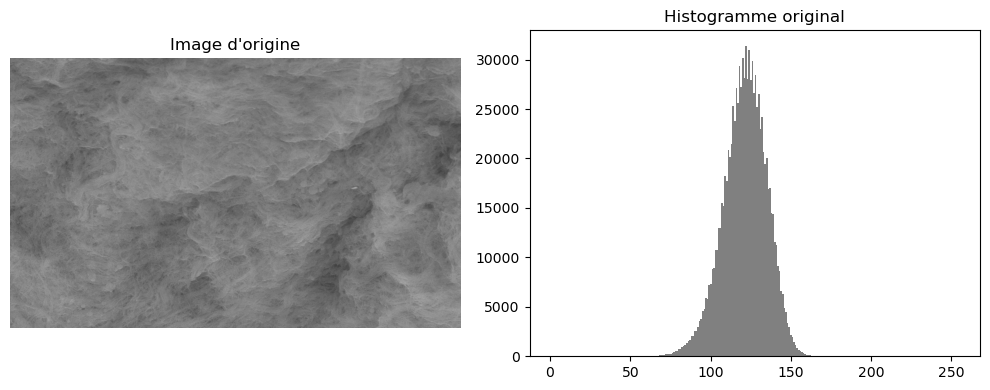

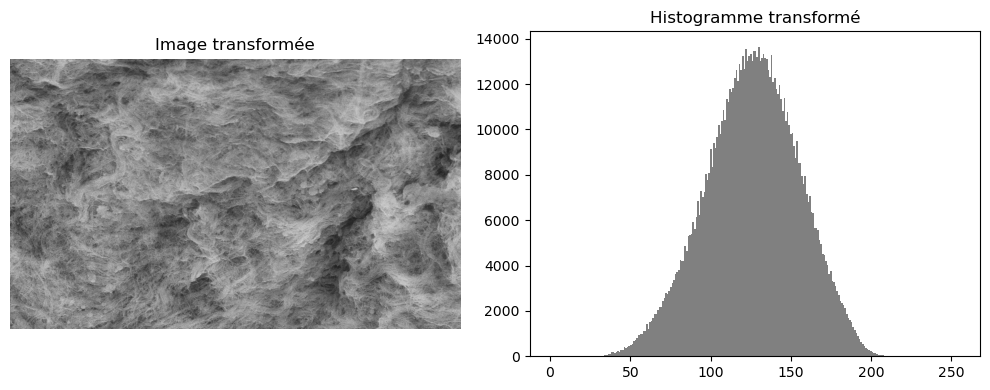

Image name : 060722-Nabila-JP-Valves-WholeMount-SAureus-pat02-28.tif
_________________________


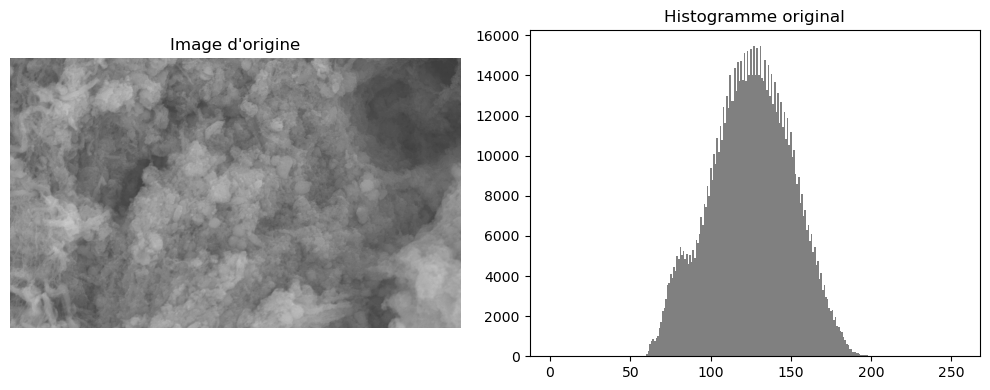

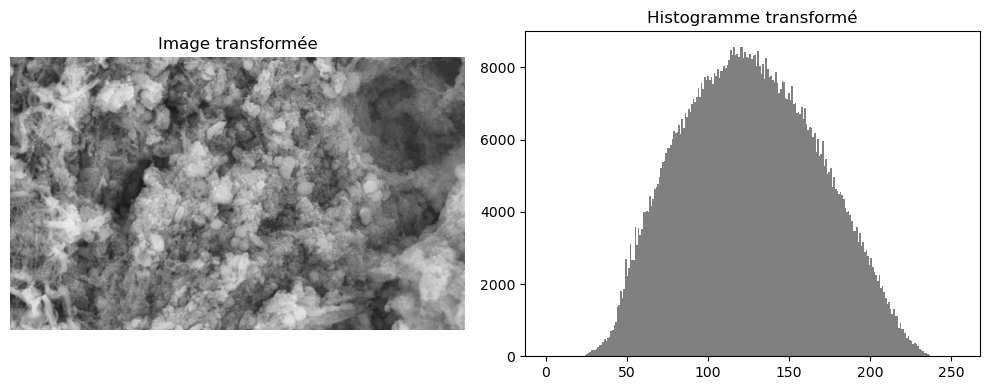

Image name : 070525-JPB-MEB-EIHNValves-Ech5-ZigZag0015.tif
_________________________


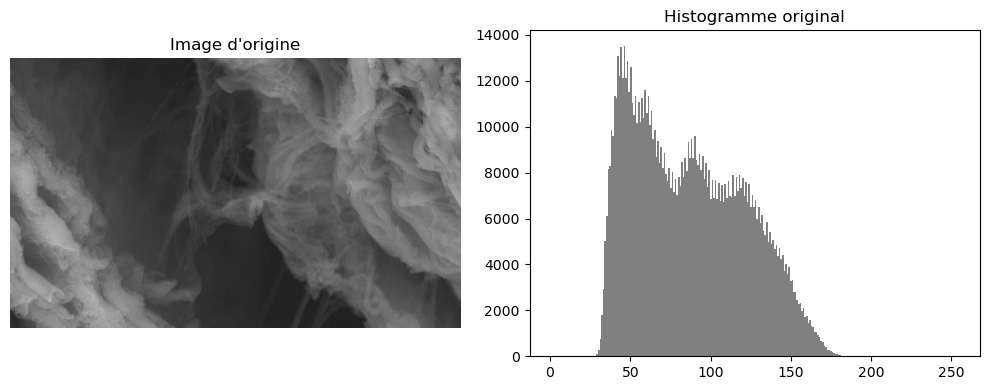

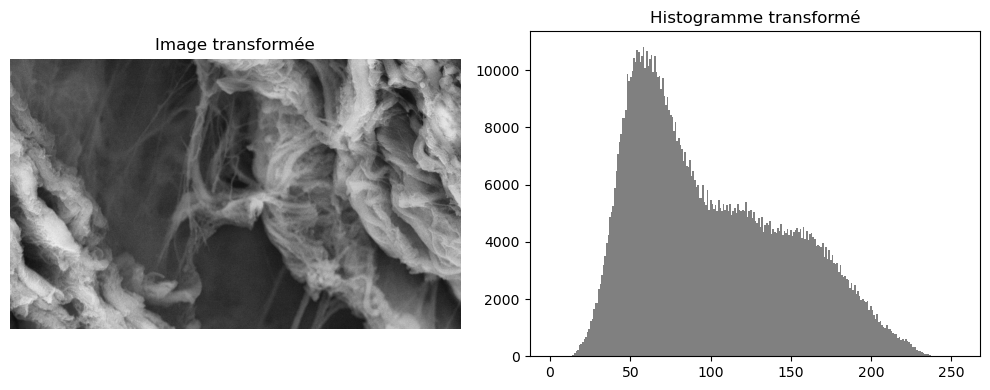

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0081.tif
_________________________


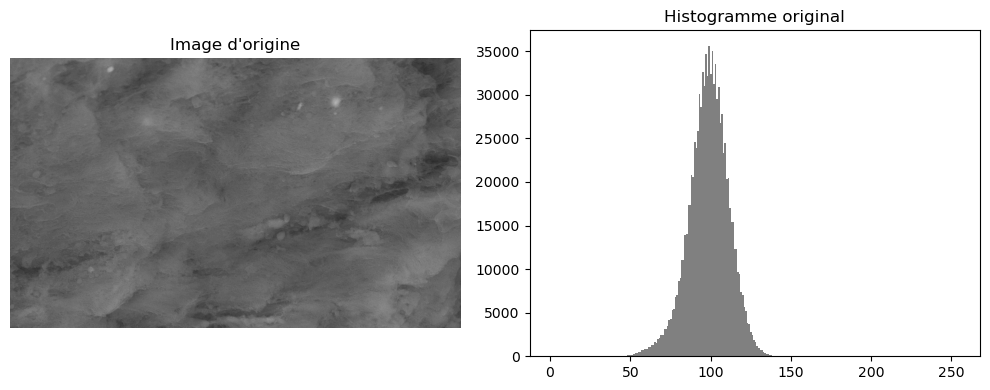

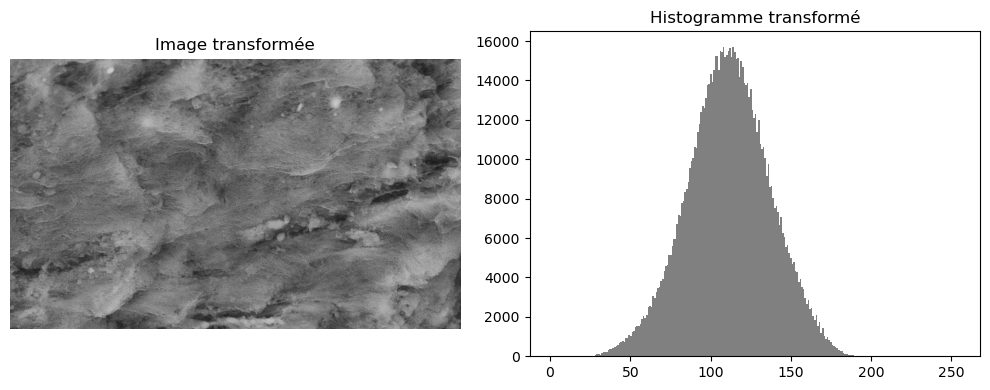

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0011.tif
_________________________


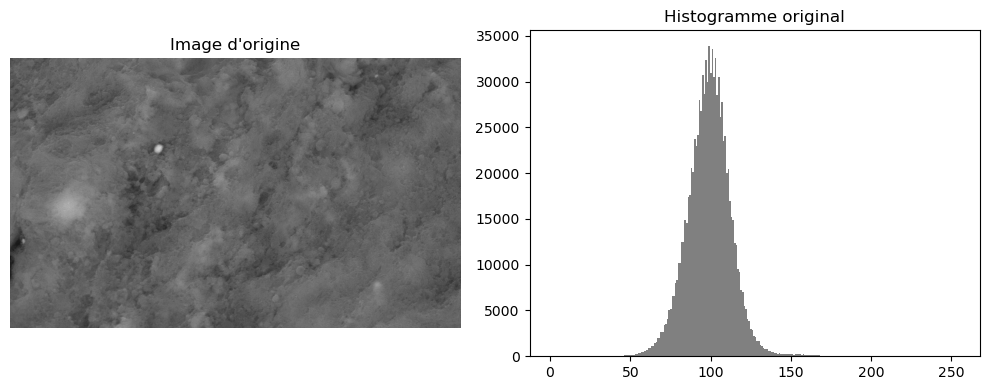

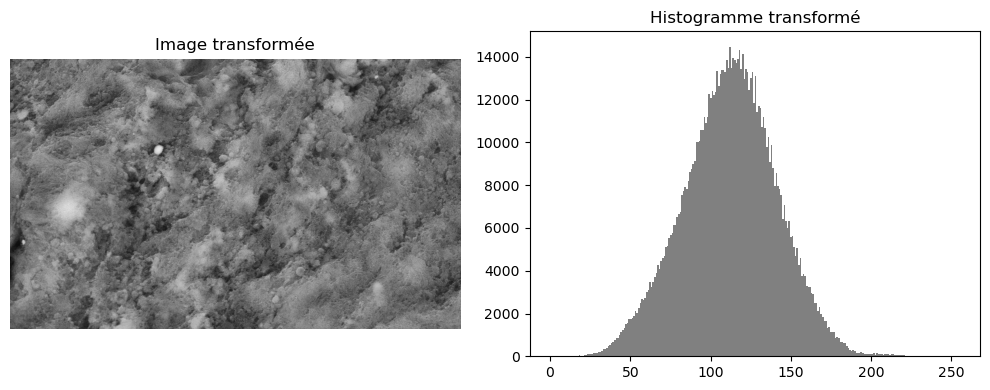

In [5]:
def CLAHE(img : np.array):

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img)
    return Image.fromarray(cl1)


plot_exemples(data_folder=data_folder,transform=CLAHE)

## Normalisation 

L'idée est de fixer une moyenne (arbitrairement : 255/2=128) standard pour limiter le biais de l'intensité moyenne d'une image par rapport aux autres pour l'analyse de texture 

$$
I_{\text{new}}(x, y) = \text{clip}\left( I(x, y) + \left( \mu_{\text{cible}} - \mu_{\text{originale}} \right),\ 0,\ 255 \right)
$$

où :
-  I(x, y) : intensité du pixel original
- $ \mu_{\text{originale}} $ : moyenne de l’image d’entrée
- $  \mu_{\text{cible}} $: moyenne souhaitée (ex. 128)
- `clip(…)` : limite les valeurs pour rester dans [0, 255]


Image name : 070525-JPB-MEB-EIHNValves-Ech6-ZigZag0074.tif
_________________________


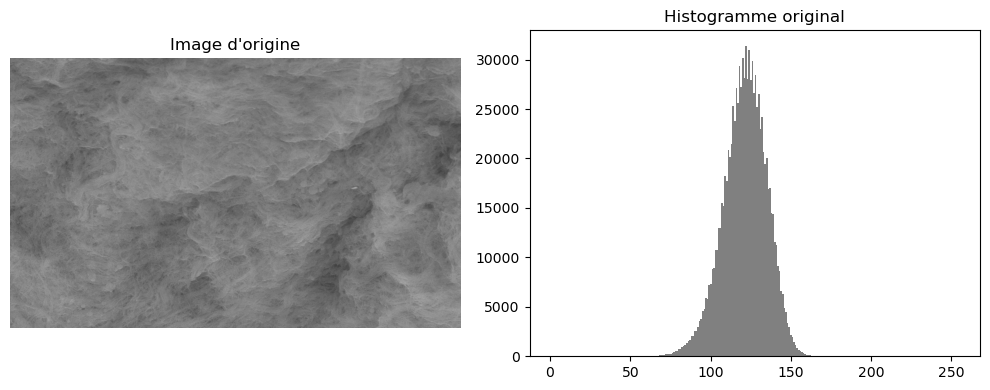

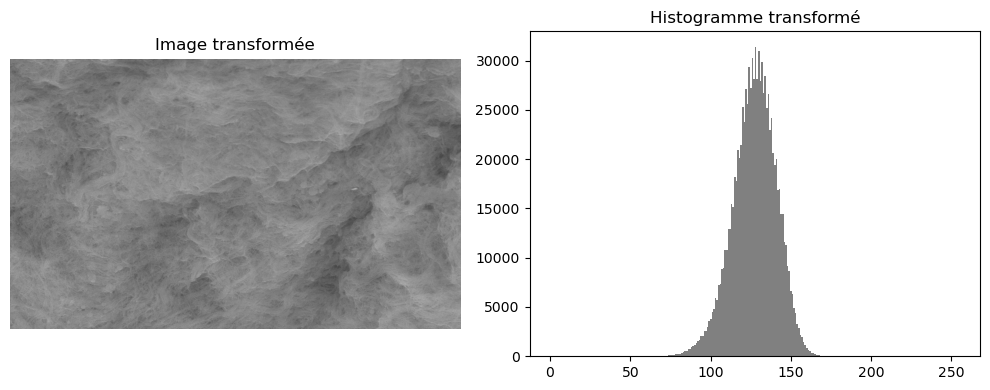

Image name : 060722-Nabila-JP-Valves-WholeMount-SAureus-pat02-28.tif
_________________________


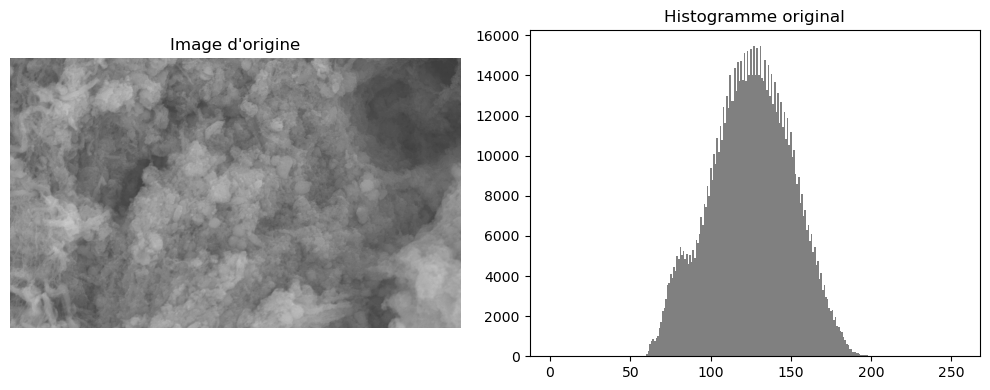

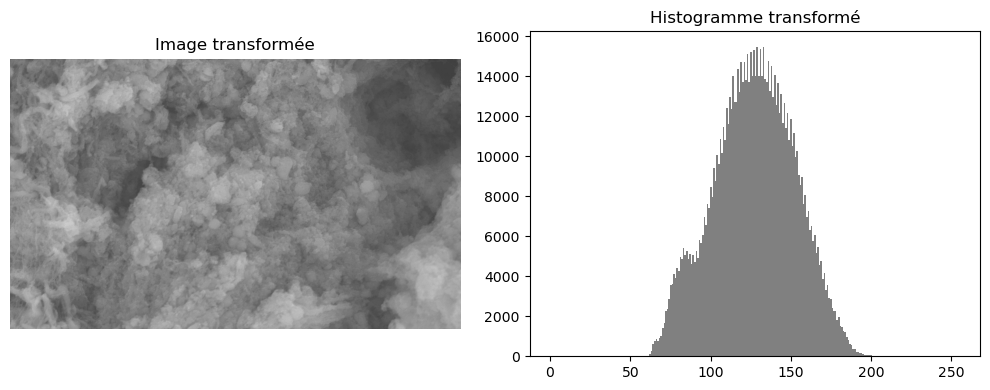

Image name : 070525-JPB-MEB-EIHNValves-Ech5-ZigZag0015.tif
_________________________


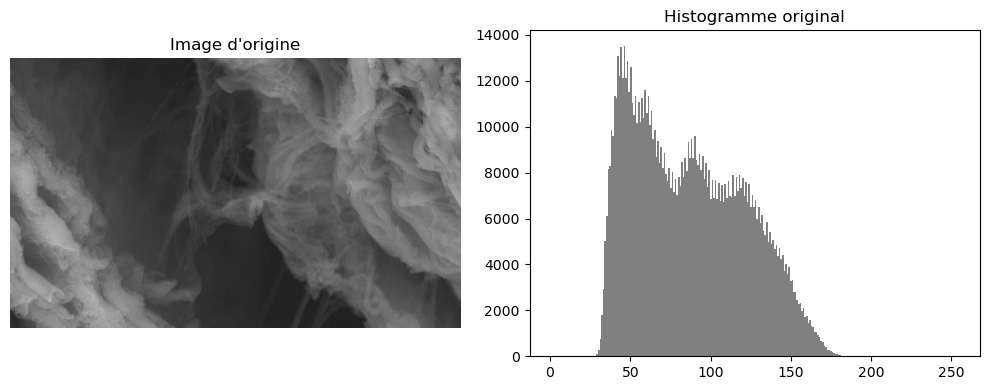

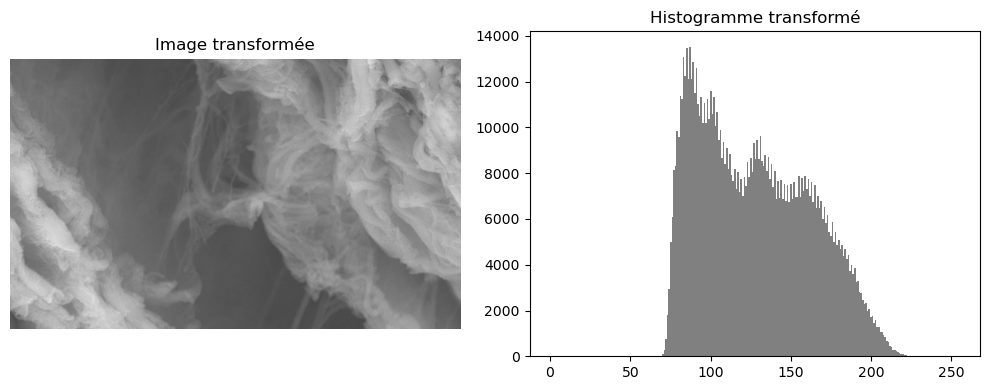

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0081.tif
_________________________


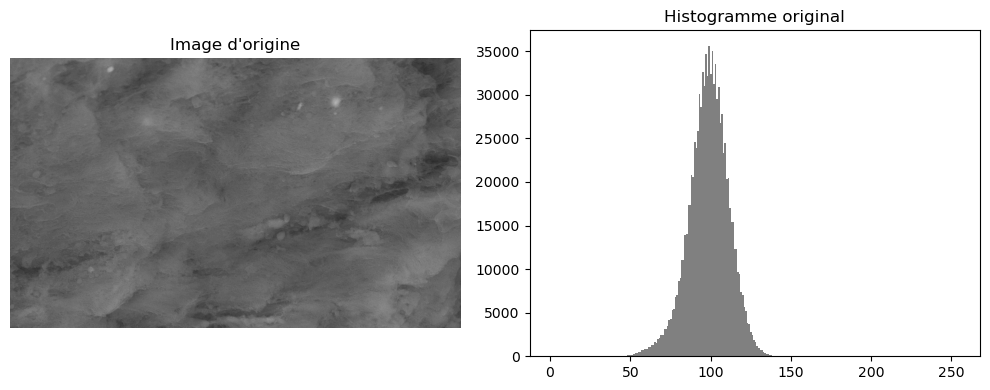

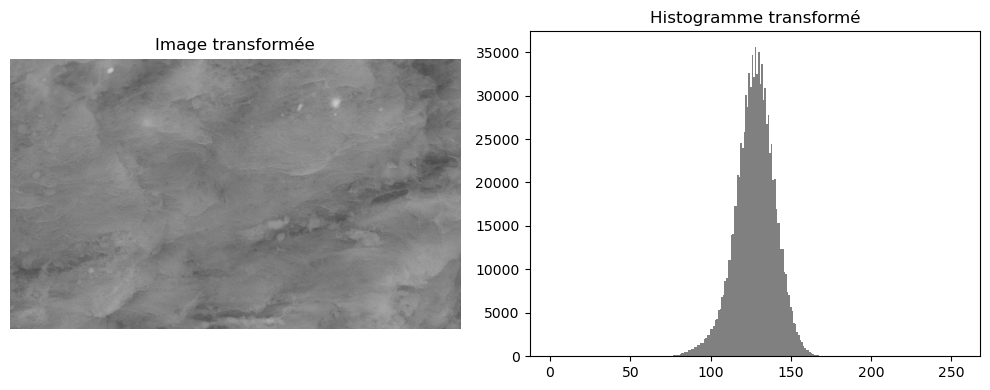

Image name : 070525-JPB-MEB-EIHNValves-Ech4-ZigZag0011.tif
_________________________


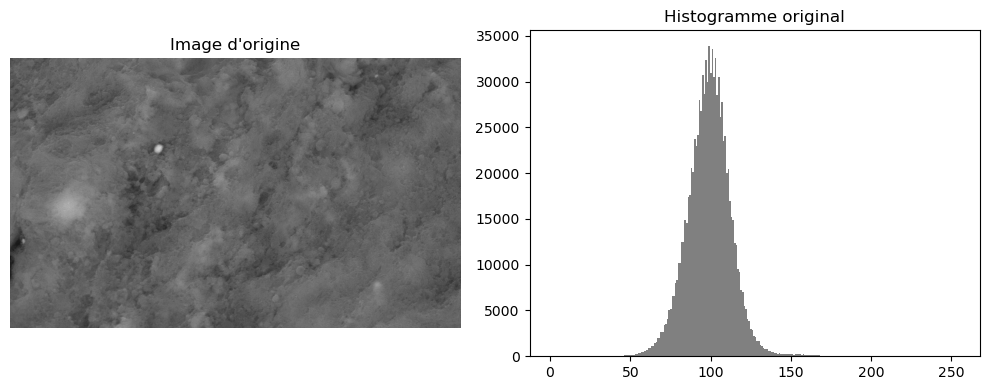

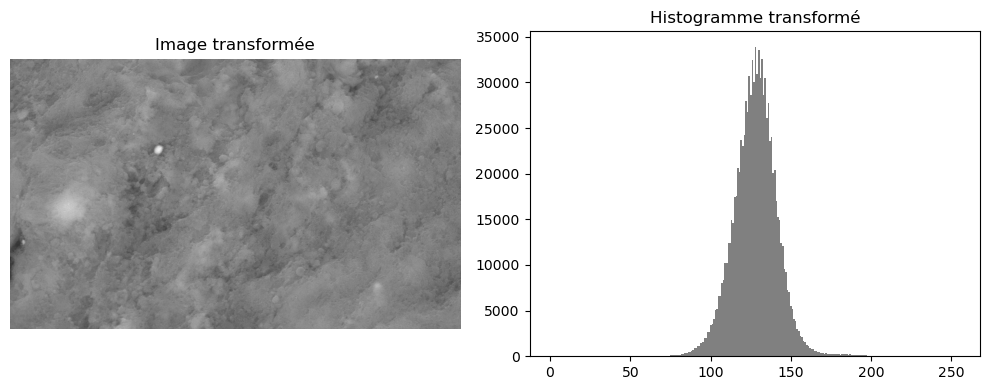

In [6]:


def normalize_to_mean(img : np.ndarray, target_mean=128):
  
    if img.ndim != 2:
        raise ValueError("Image doit être en niveaux de gris (2D).")

    img = img.astype(np.float32)
    mean_orig = np.mean(img)

    shift = target_mean - mean_orig
    img_norm = img + shift
    img_norm = np.clip(img_norm, 0, 255).astype(np.uint8)

    return Image.fromarray(img_norm)


plot_exemples(data_folder=data_folder,transform=normalize_to_mean)
